In [1]:

#imports 
from re import I
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import src
from src.etl import utils
import src.etl.constants as c
import matplotlib.lines as mlines
import functools
import numpy as np
from scipy import stats

In [6]:
# Figs config
sns.set_theme()
sns.set_context("paper")
matplotlib.rcParams['figure.dpi'] = 900
plt.rcParams['figure.dpi']= 900
matplotlib.rcParams['date.autoformatter.day'] = '%d/%m/%Y'
plt.rcParams['date.autoformatter.day'] = '%d/%m/%Y'
matplotlib.rcParams['savefig.directory'] = '/graphics'
plt.rcParams['savefig.directory'] = '/graphics'
matplotlib.rcParams['savefig.format']='JPEG'
plt.rcParams['savefig.format']='JPEG'
matplotlib.rcParams['axes.linewidth']= 1.5
plt.rcParams['axes.linewidth']= 1.5
matplotlib.rcParams['axes.edgecolor']='black'
plt.rcParams['axes.edgecolor']='black'
matplotlib.rcParams['font.sans-serif']='Arial'
plt.rcParams['font.sans-serif']='Arial'
matplotlib.rcParams['font.size'] = 11
plt.rcParams['font.size'] = 11

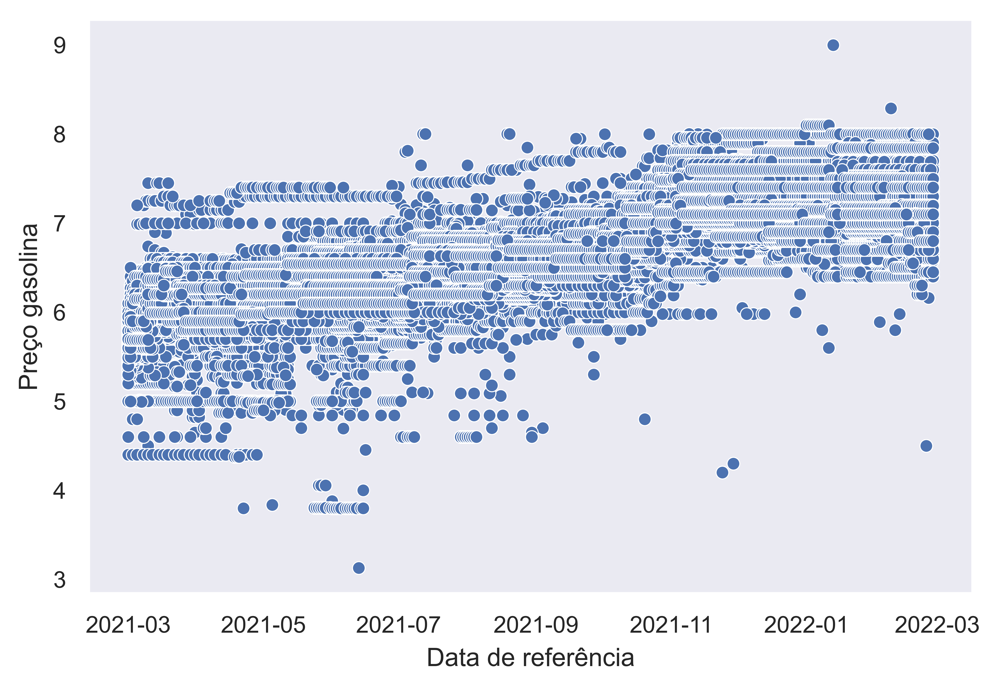

In [20]:
# ----------------------------------------------------------------- Figura  - Preços
rf_base = (utils.data_loader('rf_base')
          .dropna(subset=['price']) 
          .drop(columns=['consecutive_nulls', 'ffilled_price', 'dt_str']))

outliers_base = (utils.data_loader('outliers_base')
                .query('BOL_OUTLIER==1')
                .rename(columns={
                                'DT_COLET':'dt', 
                                'NO_SEQ_POSTO_PESQ_PRC_BOMBA':'id_station', 
                                'VR_PRC_BOMBA_VND':'price'})
                .drop(columns=['BOL_OUTLIER'])
                .loc[:,rf_base.columns.tolist()])

prices_with_outliers = pd.concat([outliers_base, rf_base])

sns.set_style("dark")
fig = sns.scatterplot(x='dt', y='price', data = prices_with_outliers)

fig.set(xlabel='Data de referência', 
        ylabel='Preço gasolina')

fig.get_figure().savefig(f'graphics/fig_gas_prices.jpeg')
fig.get_figure().show()


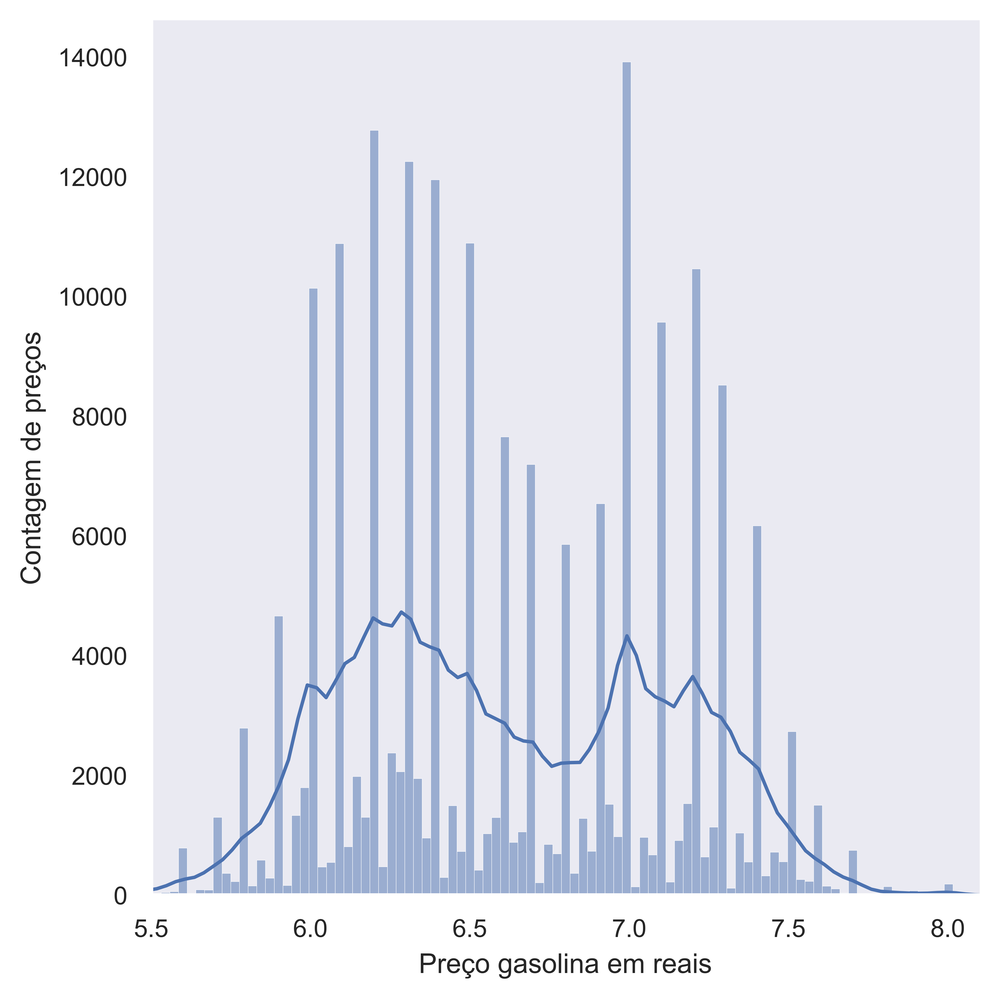

In [21]:
# ----------------------------------------------------------------- Figura - Histograma preços de gasolina
rf_base = (utils.data_loader('rf_base')
          .dropna(subset=['price']) 
          .drop(columns=['ffilled_price', 'dt_str'])
          .sort_values(by=['id_station', 'dt'])
          .assign(
              dif_date = lambda x: x.groupby(['id_station'])['dt'].diff().dt.days,
          )
          .dropna()
          .query('dif_date<40')
          .drop(columns=['dt','dif_date', 'id_station', 'consecutive_nulls']))

outliers_base = (utils.data_loader('outliers_base')
                .query('BOL_OUTLIER==1')
                .dropna()
                .rename(columns={'VR_PRC_BOMBA_VND':'price'})
                .query('dif_date<40')
                .loc[:,rf_base.columns.tolist()]
                
                )

prices = pd.concat([outliers_base, rf_base], ignore_index=True)

sns.set_style("dark")
fig = sns.displot(prices, x="price", kde=True)

fig.set(xlabel='Preço gasolina em reais', 
        ylabel='Contagem de preços',
        xlim = (5.5,8.1))

fig.savefig(f'graphics/fig_dist_gas_prices.jpeg')

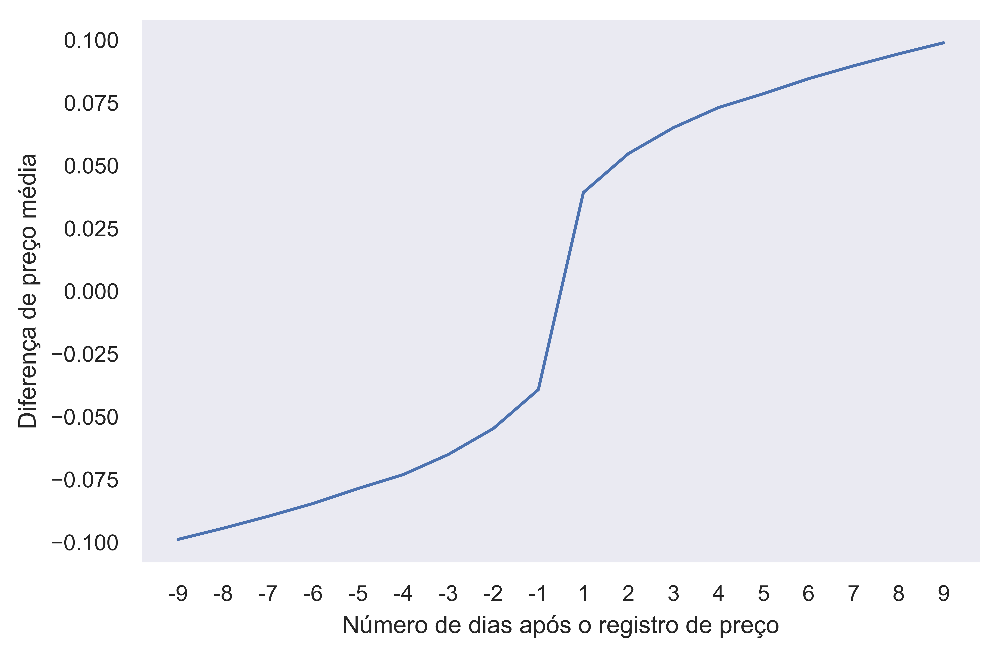

In [22]:
# ----------------------------------------------------------------- Figura - Media de diferenças de preço no tempo em função da quantidade de dias passados
# consecutive_virtual_nulls
k = 9

rf_base = (utils.data_loader('rf_base')
          .dropna(subset=['price']) 
          .drop(columns=['ffilled_price', 'dt_str'])
          .drop(columns=['consecutive_nulls'])
          .dropna()
)

outliers_base = (utils.data_loader('outliers_base')
                .query('BOL_OUTLIER==1')
                .rename(columns={'DT_COLET':'dt', 'NO_SEQ_POSTO_PESQ_PRC_BOMBA':'id_station', 'VR_PRC_BOMBA_VND':'price'})
                .dropna()
                .loc[:,rf_base.columns.tolist()]
                )

df = pd.concat([outliers_base, rf_base], ignore_index=True).sort_values(by=['id_station', 'dt'])

# store shifted values of each price
grouped = df.groupby('id_station', as_index=False)['price']
dif_cols = []
for n in range(-k,k+1):
    df[f'price_shifted_{n}'] = grouped.shift(n)

# dif from shifted values
for n in range(-k,k+1):    
    dif_cols.append(str(n))
    df[str(n)] = df['price']-df[f'price_shifted_{n}']

df_plot = (
    df
     .loc[:,dif_cols]
     .melt(value_vars = dif_cols)
     .query('value**2>0.01') #only significant differences
     .dropna()
     .groupby('variable', as_index=False)
     .mean()
     .sort_values(by='value')
)

sns.set_style("dark")
fig = sns.lineplot(x='variable', y='value', data=df_plot)

fig.set(xlabel = 'Número de dias após o registro de preço',
        ylabel = 'Diferença de preço média')

fig.get_figure().savefig(f'graphics/fig_media_dif_prices_entre_intervalos.jpeg')

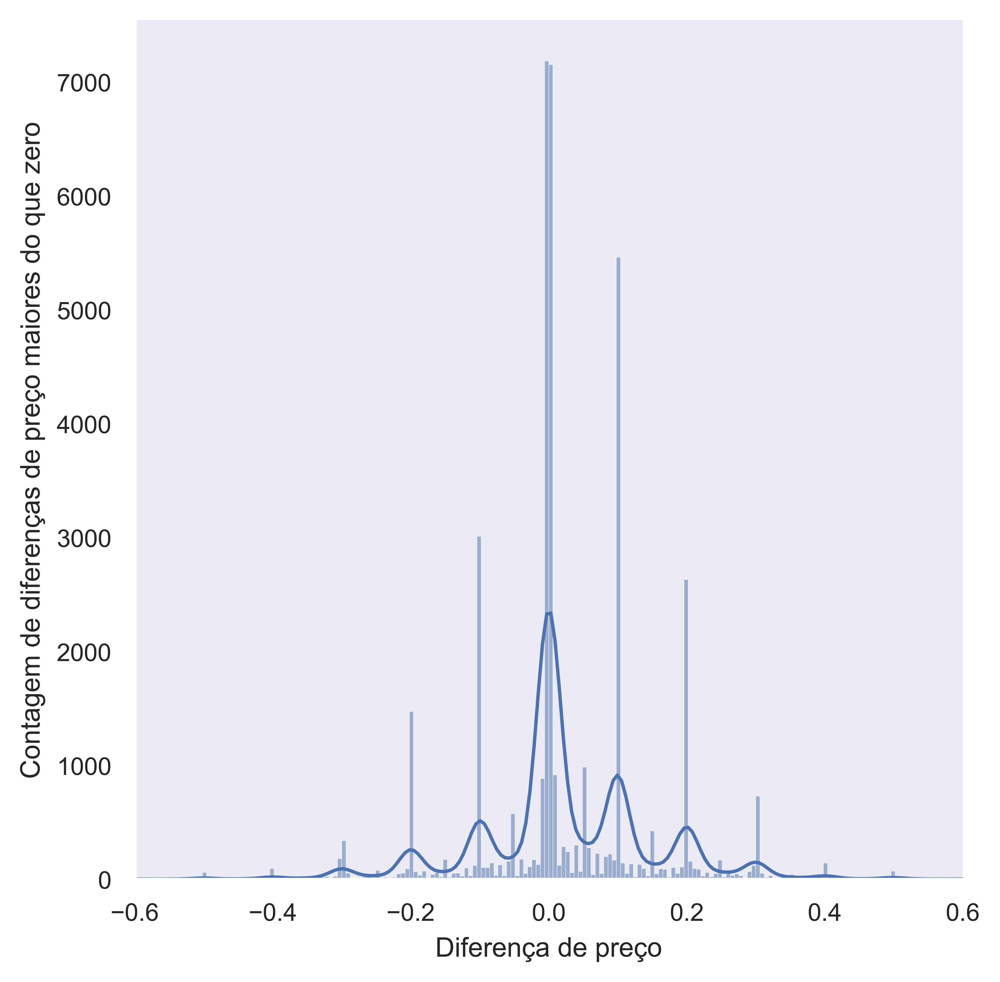

In [23]:
# ----------------------------------------------------------------- Figura - Distribuição de preço em função da quantidade de nulos
rf_base = (utils.data_loader('rf_base')
          .dropna(subset=['price']) 
          .drop(columns=['ffilled_price', 'dt_str'])
          .sort_values(by=['id_station', 'dt'])
          .assign(
              dif_date = lambda x: x.groupby(['id_station'])['dt'].diff().dt.days,
              dif_value = lambda x: x.groupby(['id_station'])['price'].diff()
          )
          .drop(columns=['dt','price', 'id_station', 'consecutive_nulls'])
          .dropna()
          .query('dif_value**2>0')
          .query('dif_value**2<0.36')
          .query('dif_date<40'))


outliers_base = (utils.data_loader('outliers_base')
                .query('BOL_OUTLIER==1')
                .query('dif_value**2>0.01')
                .query('dif_value**2<0.36')
                .dropna()
                .loc[:,rf_base.columns.tolist()]
                .query('dif_date<40'))

dif_dates_prices = pd.concat([outliers_base, rf_base], ignore_index=True)

sns.set_style("dark")
fig = sns.displot(dif_dates_prices, x="dif_value", kde=True)

fig.set(xlabel='Diferença de preço',
        ylabel='Contagem de diferenças de preço maiores do que zero',
        xlim=(-0.6,0.6))

fig.savefig(f'graphics/fig_dist_difs_prices.jpeg')

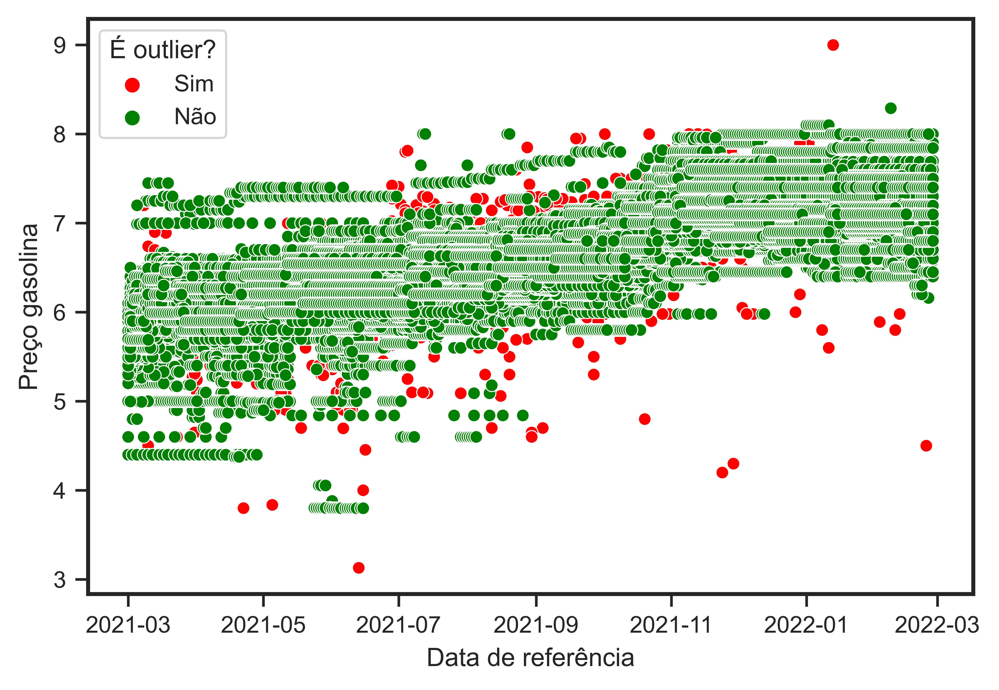

In [24]:
# ----------------------------------------------------------------- Figura  - Outliers
rf_base = (utils.data_loader('rf_base')
          .dropna(subset=['price']) 
          .drop(columns=['consecutive_nulls', 'ffilled_price', 'dt_str']))
rf_base['É outlier?']='Não'

outliers_base = (utils.data_loader('outliers_base')
                .query('BOL_OUTLIER==1')
                .rename(columns={'BOL_OUTLIER':'É outlier?',
                                'DT_COLET':'dt', 
                                'NO_SEQ_POSTO_PESQ_PRC_BOMBA':'id_station', 
                                'VR_PRC_BOMBA_VND':'price'})
                .replace(1,'Sim')
                .loc[:,rf_base.columns.tolist()])

prices_with_outliers = pd.concat([outliers_base, rf_base])
palette={'Não':'green', 'Sim':'red'}
sns.set_style("ticks")
fig = sns.scatterplot(x='dt', y='price', hue='É outlier?', data = prices_with_outliers, palette=palette)

fig.set(xlabel='Data de referência',
        ylabel='Preço gasolina')

fig.get_figure().savefig(f'graphics/fig_outliers.jpeg')

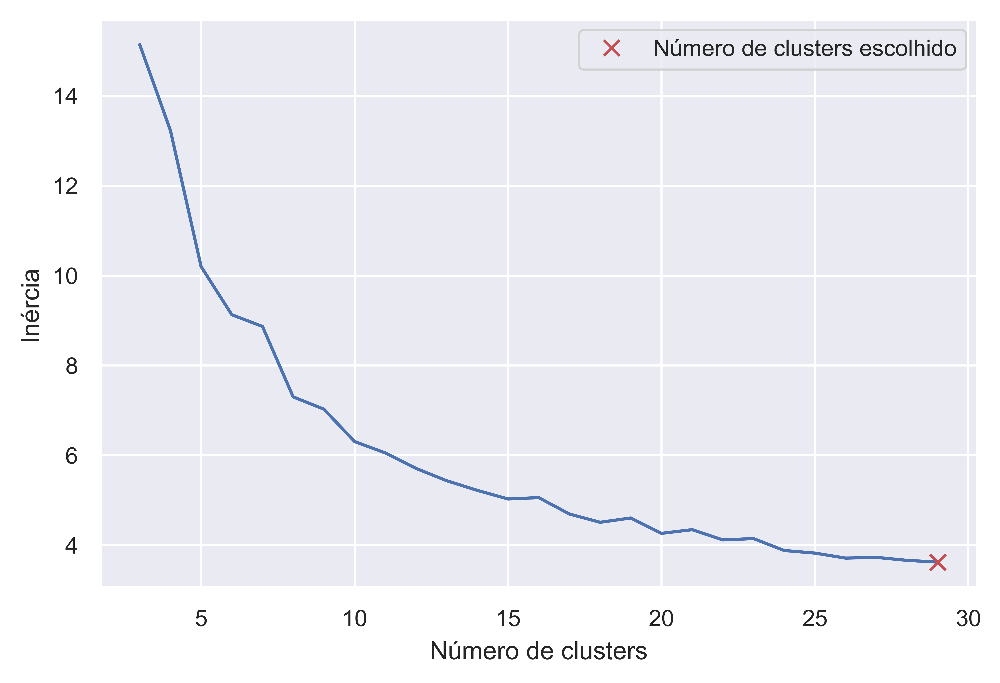

In [25]:
# -----------------------------------------------------------------Figura  - Elbow Method
hiperparam_clus = utils.data_loader('hiperparam_clus')

sns.set_style("darkgrid")
fig = sns.lineplot(x="n_clus", y="inertia", data=hiperparam_clus)

#Ponto no gráfico
choosen_cluster = hiperparam_clus.query('best_nclus==True')
nclus = choosen_cluster['n_clus'].item()
inertia = choosen_cluster['inertia'].item()

plt.plot(nclus,inertia,'x', ms=6, mec='r', mfc='none')

red_square = mlines.Line2D([], [], color='r', marker='x', linestyle='None',
                          markersize=6, label='Número de clusters escolhido')

fig.set(xlabel='Número de clusters', ylabel='Inércia')
plt.legend(handles=[red_square])

fig.get_figure().savefig(f'graphics/fig_elbow.jpeg')

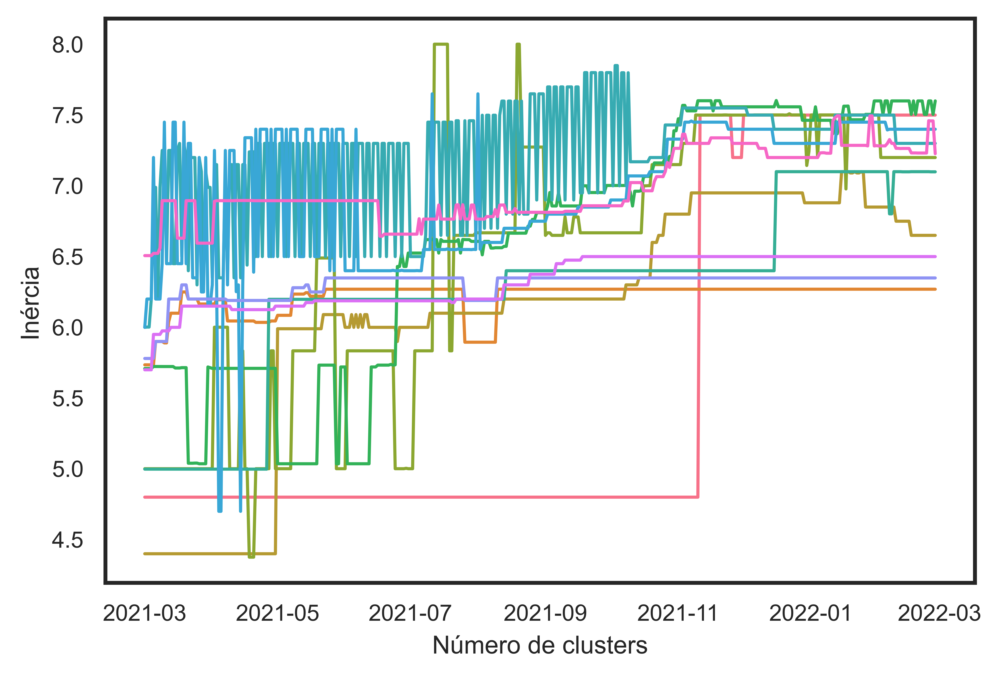

In [26]:
# -----------------------------------------------------------------Figura  - Percentis Clusters escolhidos
X = utils.data_loader('X')
cols = [col.replace('p_', 'percentil ').replace('_clus_', ' - cluster ') for col in X.columns]
X.columns = cols

X = X.melt(value_vars=cols, ignore_index= False).reset_index()
sns.set_style("white")

ax = sns.lineplot(y='value', x = 'dt', data = X, hue='variable')
ax.legend_.remove()
ax.set(xlabel='Número de clusters', ylabel='Inércia')

plt.savefig(f'graphics/fig_clusters_escolhidos.jpeg')

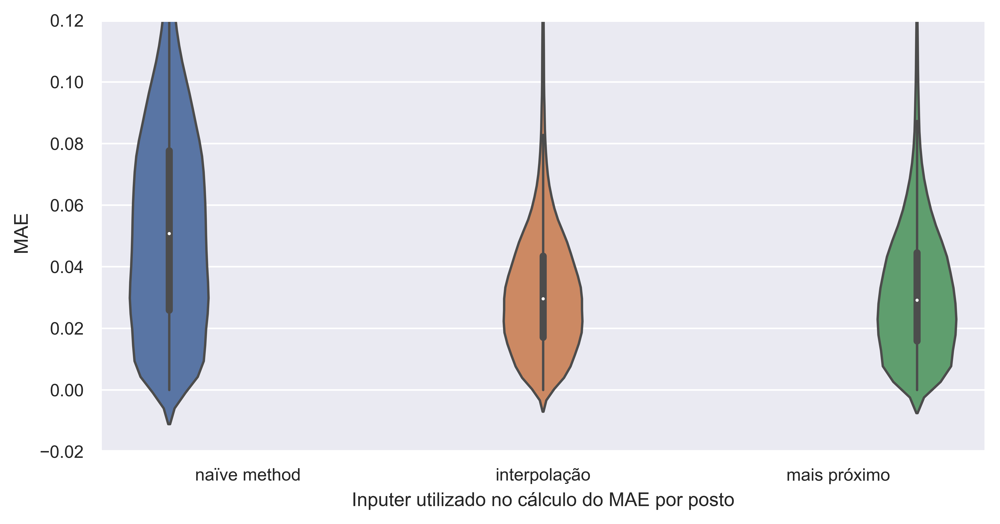

In [34]:
# -----------------------------------------------------------------Figura  - Naive approachs
naive = utils.data_loader('naive_approach_metrics')

naive = naive.drop(columns = ['MAE bfill']).melt(value_vars = ['MAE ffill', 'MAE linear', 'MAE nearest'],
                                                 id_vars=['consecutive_nulls','id_station'])
naive = naive.query("value != 'MAE bfill'")                        
naive = naive.replace({'MAE ffill':'naïve method', 'MAE linear':'interpolação', 'MAE nearest':'mais próximo'})
sns.set_style("darkgrid")
ax = sns.violinplot(data=naive, x= 'variable', y ="value", hue='variable')
ax.legend_.remove()
plt.ylim(-0.02,0.12)
plt.ylabel(' MAE')
plt.xlabel('Inputer utilizado no cálculo do MAE por posto')
plt.savefig(f'graphics/fig_mae_dist_per_method.jpeg')

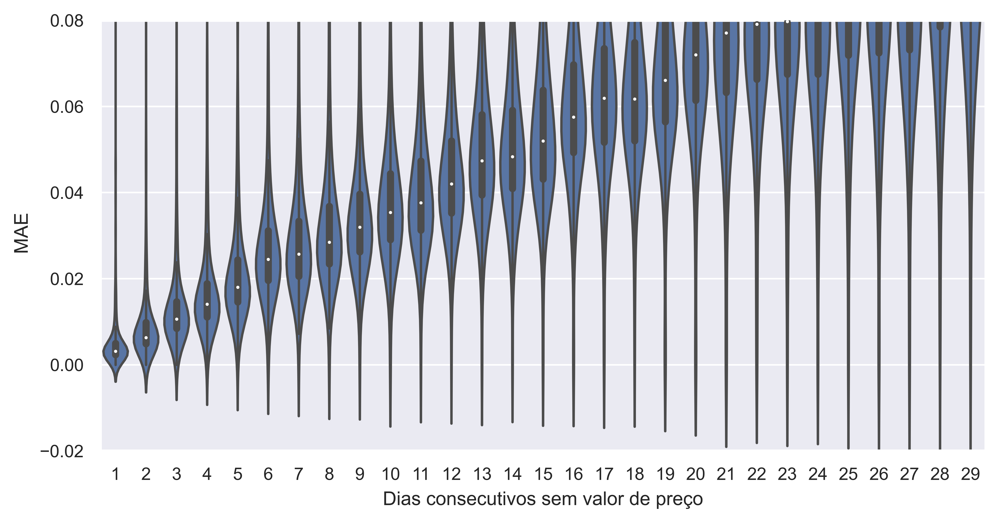

In [35]:
# -----------------------------------------------------------------Figura  -FFill por numero de nulos consecutivos
naive = utils.data_loader('naive_approach_metrics')

naive = naive.drop(columns = ['MAE bfill','MAE nearest', 'MAE linear']).melt(value_vars = [ 'MAE ffill'],
                                                 id_vars=['consecutive_nulls','id_station'])

naive = naive.replace({'MAE ffill':'naïve method'})
sns.set_style("darkgrid")
ax = sns.violinplot(data=naive, x= 'consecutive_nulls', y ="value", hue='variable')
ax.legend_.remove()
plt.ylim(-0.02,0.08)
plt.ylabel(' MAE')
plt.xlabel('Dias consecutivos sem valor de preço')
plt.savefig(f'graphics/fig_mae_distribution_perconsecutive_nulls.jpeg')

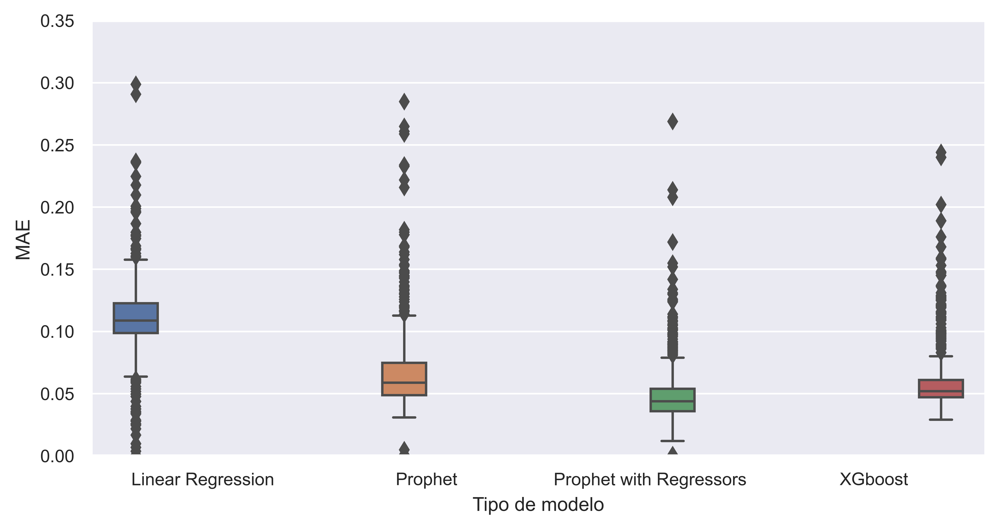

In [36]:
# -----------------------------------------------------------------Figura  Distribuição erros modelos mlflow
mlflow_metrics = utils.data_loader('metrics_mlflow')
sns.set_style("darkgrid")


fig = sns.boxplot(x="strategy", y="MAE",
            hue="strategy",
            data=mlflow_metrics)
#sns.despine(offset=10, trim=True)
fig.legend_.remove()
plt.xlabel('Tipo de modelo')
plt.ylim(0,0.35)
plt.savefig(f'graphics/fig_models_compare.jpeg')

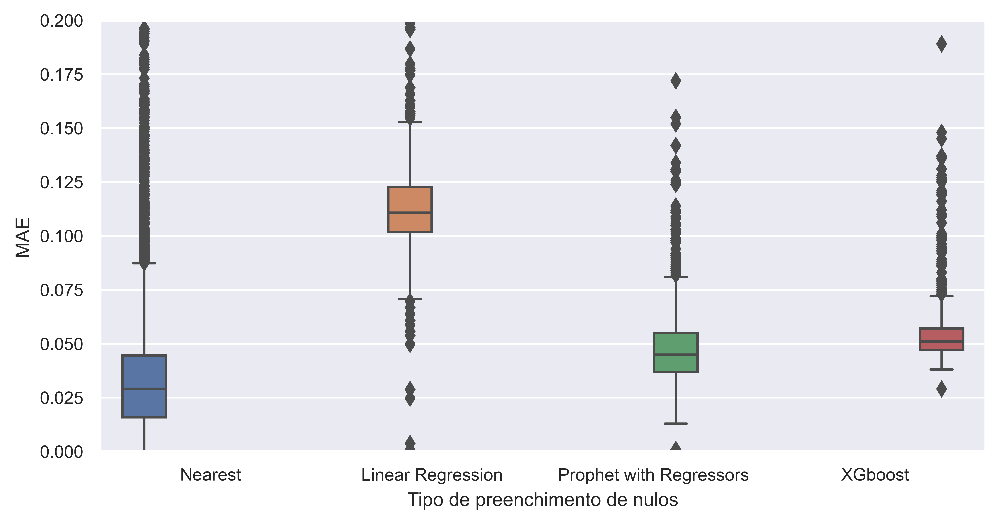

In [37]:
# -----------------------------------------------------------------Figura  Distribuição erros modelos mlflow e naives
mlflow_metrics = (utils.data_loader('metrics_mlflow')
                .pipe(pd.pivot,index=['id_station'], values = ['MAE'], columns=[ 'strategy']))
mlflow_metrics.columns = mlflow_metrics.columns.droplevel(0)


df_naive = (utils.data_loader('naive_approach_metrics')
                .astype(dtype={'id_station':'int'})
                .set_index('id_station'))

df_perf = (df_naive
            .join(mlflow_metrics, how='left')
            .drop(axis = 1, columns=['Prophet','MAE bfill', 'MAE linear','MAE ffill'])
            .reset_index()
            .melt(id_vars = ['id_station', 'consecutive_nulls'])
            .replace({"MAE nearest":'Nearest'})
            .rename(columns={'variable':'Abordagem'}))

fig = sns.boxplot(x="Abordagem", y="value",
            hue="Abordagem",
            data=df_perf)
#sns.despine(offset=10, trim=True)
fig.legend_.remove()
plt.rcParams['figure.figsize']=[8.0, 4.0]
plt.xlabel('Tipo de preenchimento de nulos')
plt.ylabel('MAE')
plt.ylim(0,0.20)

plt.savefig(f'graphics/fig_inputers_compare.jpeg')

In [38]:
#Extra ---------------------------------------------------------
df_perf['consecutive_nulls'].unique()
def compare_7(r):

    r = r[r['consecutive_nulls']==25]
    r = r[r['value'].min()==r['value']]
    return r

df_perf.groupby('id_station').apply(compare_7)['Abordagem'].value_counts()

Prophet with Regressors    279
Nearest                    201
XGboost                     64
Linear Regression            2
Name: Abordagem, dtype: int64

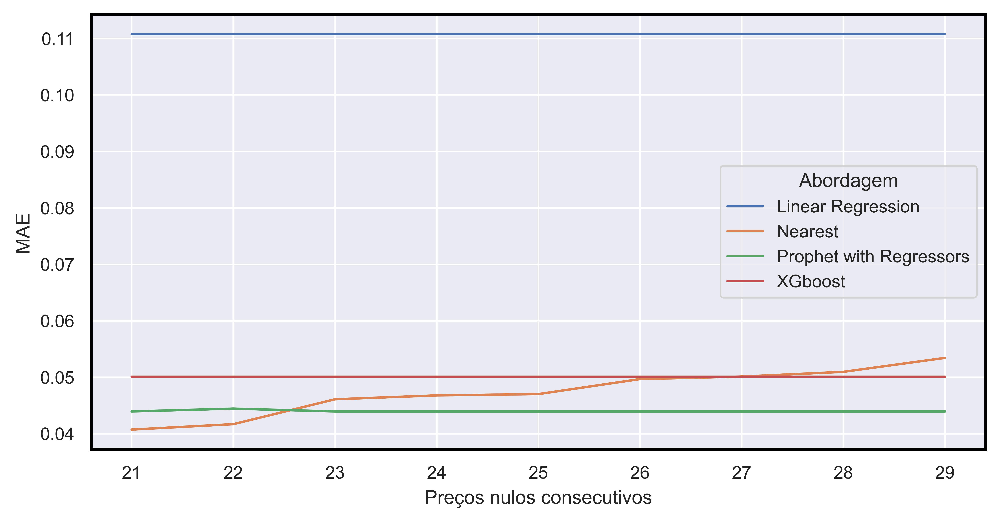

In [39]:
#------------------------------- Evolução do método em função da quantidade de nulos seguidos
mlflow_metrics = (utils.data_loader('metrics_mlflow')
                .pipe(pd.pivot,index=['id_station'], values = ['MAE'], columns=[ 'strategy']))
mlflow_metrics.columns = mlflow_metrics.columns.droplevel(0)


df_naive = (utils.data_loader('naive_approach_metrics')
                .astype(dtype={'id_station':'int'})
                .set_index('id_station'))

df_perf = (df_naive
            .join(mlflow_metrics, how='left')
            .drop(axis = 1, columns=['Prophet','MAE bfill', 'MAE linear','MAE ffill'])
            .reset_index()
            .melt(id_vars = ['id_station', 'consecutive_nulls'])
            .replace({"MAE nearest":'Nearest'})
            .rename(columns={'variable':'Abordagem'}))

df_plot = df_perf.query('consecutive_nulls>20').drop(columns='id_station').groupby(['consecutive_nulls','Abordagem'], as_index=False).median()
sns.set_context("paper")

matplotlib.rcParams['figure.dpi'] = 900
plt.rcParams['figure.dpi']= 900
matplotlib.rcParams['date.autoformatter.day'] = '%d/%m/%Y'
plt.rcParams['date.autoformatter.day'] = '%d/%m/%Y'
matplotlib.rcParams['savefig.directory'] = '/graphics'
plt.rcParams['savefig.directory'] = '/graphics'
matplotlib.rcParams['savefig.format']='JPEG'
plt.rcParams['savefig.format']='JPEG'
matplotlib.rcParams['axes.linewidth']= 1.5
plt.rcParams['axes.linewidth']= 1.5
matplotlib.rcParams['axes.edgecolor']='black'
plt.rcParams['axes.edgecolor']='black'
matplotlib.rcParams['font.sans-serif']='Arial'
plt.rcParams['font.sans-serif']='Arial'
matplotlib.rcParams['font.size'] = 11
plt.rcParams['font.size'] = 11
ax = sns.lineplot(y='value', x = 'consecutive_nulls', data = df_plot, hue='Abordagem')
sns.set_style("ticks")
plt.ylabel('MAE')
plt.xlabel('Preços nulos consecutivos')
plt.savefig(f'graphics/fig_evol_melhores_inputers.jpeg')


,id_station,MAE
strategy,,
Linear Regression,4,4
Prophet with Regressors,534,534
XGboost,130,130


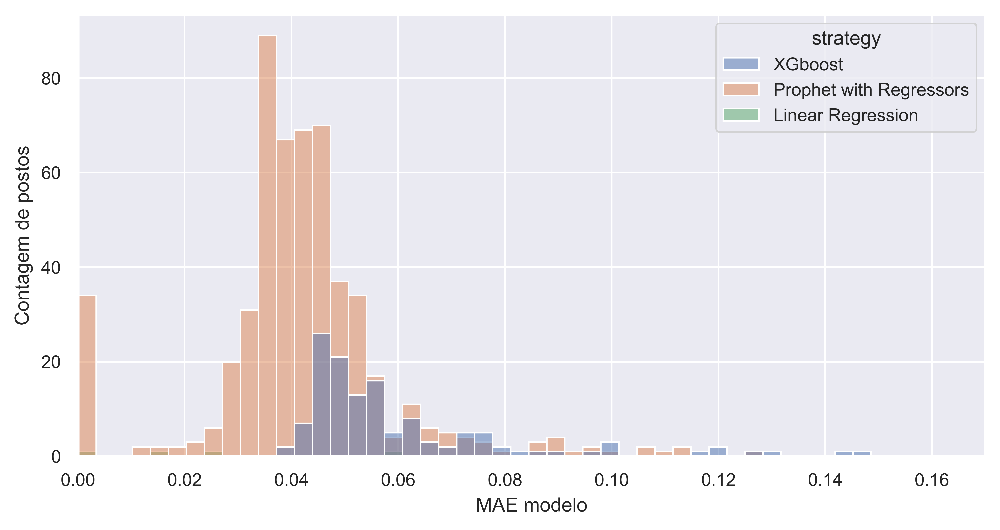

In [40]:
#------------------------------------- contagem de postos por escolha de modelo

mlflow_metrics = utils.data_loader('metrics_mlflow')
def lower_mae(r):

    r = r[r['MAE']==r['MAE'].min()]
    return r

mlflow_metrics = mlflow_metrics.groupby('id_station').apply(lower_mae)
mlflow_metrics = mlflow_metrics.query("strategy !='Prophet'")
sns.set_style("darkgrid")
sns.histplot(data=mlflow_metrics, x="MAE", hue = 'strategy')
plt.xlim(0,0.17)
plt.ylabel('Contagem de postos')
plt.xlabel('MAE modelo')
plt.savefig(f'graphics/fig_count_mae_perstation_permpdel.jpeg')
mlflow_metrics.groupby('strategy').count()